In [1]:
import numpy as np
import pandas as pd
from scipy.stats import zscore
from scipy import sparse 
from scipy.spatial import ConvexHull
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

import scanpy as sc
from py_pcha import PCHA

In [2]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import anndata 
import seaborn as sns
from scipy.stats import zscore
import matplotlib.pyplot as plt
import collections
from natsort import natsorted
import re

from scipy import stats
from scipy import sparse
from sklearn.decomposition import PCA
from umap import UMAP

from matplotlib.colors import LinearSegmentedColormap

from scroutines.config_plots import *
from scroutines import powerplots # .config_plots import *
from scroutines import pnmf
from scroutines import basicu
from scroutines.gene_modules import GeneModules  


In [3]:
import numpy as np
import pandas as pd
from scipy.stats import zscore
from scipy import sparse 
from scipy.spatial import ConvexHull
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

import scanpy as sc
from py_pcha import PCHA

from scipy.stats import gaussian_kde

In [4]:
def plot3(x, y, hue, aspect_equal=False, s=10, vmin=-2.5, vmax=2.5, vminp=None, vmaxp=None, cmap='coolwarm'):
    n = len(cases_nr_short)
    fig, axs = plt.subplots(1,n,figsize=(4*n,4*1), sharex=True, sharey=True)
    fig.suptitle(hue, x=0, ha='left')
    
    showall = res[res['cond'].isin(cases_nr_short)]
    if vminp is not None:
        vmin = np.percentile(showall[hue], vminp)
    if vmaxp is not None:
        vmax = np.percentile(showall[hue], vmaxp)
            
    for i, (ax, cond) in enumerate(zip(axs.flat, cases_nr_short)):
        ax.set_title(cond)
        show = res[res['cond']==cond]
        
        ax.scatter(
                   show[x], show[y], c=show[hue], 
                   cmap=cmap,
                   vmin=vmin, vmax=vmax,
                   s=s, 
                   edgecolor='none', 
                   rasterized=True,
                  )
            
        sns.despine(ax=ax)
        # ax.xaxis.set_major_locator(MaxNLocator(nbins=3))
        # ax.yaxis.set_major_locator(MaxNLocator(nbins=3))
        if aspect_equal:
            ax.set_aspect('equal')
        if i == 0: 
            ax.set_xlabel(x)
            ax.set_ylabel(y)
        else:
            ax.set_xlabel('')
            ax.set_ylabel('')
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
    fig.tight_layout()
    
    return fig
    # plt.show()

In [5]:
def norm(x, depths):
    """
    Arguments: 
        x - cell by gene count matrix
        depths - sequencing depth per cell
        
    Output:
        xn - normalized count matrix

    This function takes raw counts as the input, and does the following steps sequencially.
         1. size normalization (CP10k) 
         2. log1p normalization (base 2 - log2(1+CP10k))
         3. zscore per gene  
    """

    xn = x/depths.reshape(-1,1)*1e4
    xn = np.log2(1+xn)
    xn = zscore(xn, axis=0)

    if np.any(np.isnan(xn)):
        print('Warning: the normalized matrix contains nan values. Check input.')
        xn = np.nan_to_num(xn, 0)

    return xn

In [6]:
def proj(x_norm, ndim, method='PCA'):
    """
    Arguments: 
        x_norm - normalized cell by gene feature matrix
        ndim   - number of dimensions

    Output:
        x_proj - a low-dimensional representation of `x_norm` 

    Here we only implemented PCA - a common projection method widely used, including by
    Adler et al. 2019 and Xie et al. 2024 for the Achetypal Analysis of scRNA-seq data.

    In principle, one can also choose to use other projection methods as needed.
    """

    if method == 'PCA':
        x_proj = PCA(n_components=ndim).fit_transform(x_norm)
    else:
        raise ValueError('methods other than PCA are not implemented...')

    return x_proj


In [7]:
def pcha(X, noc=3, delta=0, **kwargs):
    """
    """
    XC, S, C, SSE, varexpl = PCHA(X, noc=noc, delta=delta, **kwargs)
    XC = np.array(XC)
    XC = XC[:,np.argsort(XC[0])] # assign an order according to x-axis 
    return XC 

In [8]:
def downsamp(x, which='cell', p=0.8, seed=None):
    """
    Arguments:
        x - cell by gene matrix
        which - downsample cells (rows) or genes (columns)
        p - fraction of cells/genes to keep - should be a value between ~ [0,1]
    """
    n0, n1 = x.shape
    
    rng = np.random.default_rng(seed=seed)
    
    if which in [0, 'cell', 'row']:
        return x[rng.random(n0)<p, :]
    elif which in [1, 'gene', 'col', 'column']:
        return x[:, rng.random(n1)<p]
    else:
        raise ValueError('choose from cell or gene')

In [9]:
def shuffle_rows_per_col(x, seed=None):
    """
    Arguments:
       x - cell by gene matrix
       seed - a random seed for reproducibility
    
    shuffles entries across rows (cells) independently for each col (gene)
    """
    rng = np.random.default_rng(seed=seed)
    x_shuff = rng.permuted(x, axis=0)
    return x_shuff

In [10]:
def plot_archetype(ax, aa, fmt='--o', color='k', **kwargs):
    """
    """
    ax.plot(aa[0].tolist()+[aa[0,0]], aa[1].tolist()+[aa[1,0]], fmt, color=color, **kwargs)

In [11]:
def get_t_ratio(xp, aa):
    """
    Arguments:
     xp -- projected matrix (cell by 2)
     aa -- inferred archetypes (2 by noc)
     note that this function only works for 2-dimensional space only
     
    Return: 
     t-ratio - ratio of areas (convex hull vs PCH)
     
    """
    assert xp.shape[1] == aa.shape[0] == 2
    
    ch_area  = ConvexHull(xp).volume
   
    x = aa[0]
    y = aa[1]
    pch_area = 0.5*np.abs(np.dot(x,np.roll(y,1))-np.dot(y,np.roll(x,1)))

    return ch_area/pch_area 

In [12]:
class SingleCellArchetype():
    """
    """
    def __init__(self, x, depths, types):
        """
        Arguments: 
            x - cell by gene count matrix
            depths - sequencing depth per cell
            types  - cell type labels per cell
        
        Initiate the SingleCellArchetype object

        """
        
        # input
        self.x = x
        self.depths = depths
        self.types = types
        
        # cell type label
        types_idx, types_lbl = pd.factorize(types, sort=True)
        
        self.types_idx = types_idx
        self.types_lbl = types_lbl 
        
        # normalize
        self.xn = norm(self.x, self.depths)
        
        # feature matrix 
        self.xf = None 
        return 
        
    def setup_feature_matrix(self, method='data'):
        """
        """
        if method == 'data': 
            self.xf = self.xn
            print('use data')
            return  
        
        elif method == 'gshuff':
            # shuffle gene expression globally across all cells
            self.xf = shuffle_rows_per_col(self.xn)
            print('use shuffled data')
            return
            
        elif method == 'tshuff':
            # shuff each gene across cells independently - internally for each type A,B,C
            xn = self.xn
            xn_tshuff = xn.copy()
            
            types_lbl = self.types_lbl
            types_idx = self.types_idx
            for i in range(len(types_lbl)):
                xn_tshuff[types_idx==i] = shuffle_rows_per_col(xn[types_idx==i])
            self.xf = xn_tshuff
            print('use per-type shuffled data')
            return
        else:
            raise ValueError('choose from (data, gshuff, tshuff)')
    
    def proj_and_pcha(self, ndim, noc, **kwargs):
        """
        """
        xp = proj(self.xf, ndim)
        aa = pcha(xp.T, noc=noc, **kwargs)
        
        self.xp = xp
        self.aa = aa
        return (xp, aa)
        
    def downsamp_proj_pcha(self, ndim, noc, nrepeats=10, which='cell', p=0.8, **kwargs): 
        """
        """
        aa_dsamps = []
        for i in range(nrepeats):
            xn_dsamp = downsamp(self.xf, which=which, p=p)
            xp_dsamp = proj(xn_dsamp, ndim)
            aa_dsamp = pcha(xp_dsamp.T, noc=noc, **kwargs)
            aa_dsamps.append(aa_dsamp)
            
        return aa_dsamps
    
    def t_ratio_test(self, ndim, noc, nrepeats=10, **kwargs): 
        """
        this only work for 2-dimensional space for now
        """
        assert ndim == 2
        
        self.setup_feature_matrix(method='data')
        xp, aa = self.proj_and_pcha(ndim, noc)
        t_ratio = get_t_ratio(xp, aa)
        
        t_ratios_shuff = []
        for i in range(nrepeats):
            self.setup_feature_matrix(method='gshuff')
            xp_shuff, aa_shuff = self.proj_and_pcha(ndim, noc)
            t_ratio_shuff = get_t_ratio(xp_shuff, aa_shuff)
            t_ratios_shuff.append(t_ratio_shuff)
            
        pvalue = (np.sum(t_ratio > t_ratios_shuff)+1)/nrepeats
        
        return t_ratio, t_ratios_shuff, pvalue

In [94]:
outdirfig = "/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/figures/260211"
outdirdata = "/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome"
!mkdir -p $outdirfig

# load data 

In [14]:
%%time
f_anndata_in  = "../../data/v1_multiome/superdupermegaRNA_hasraw_multiome_IT.h5ad"
adata = anndata.read(f_anndata_in)
adata

CPU times: user 1.89 s, sys: 13.3 s, total: 15.2 s
Wall time: 1min 34s


AnnData object with n_obs × n_vars = 89287 × 16567
    obs: 'Age', 'Doublet', 'Doublet Score', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'Class', 'Sample', 'total_counts', 'pct_counts_mt', 'n_genes_by_counts', 'total_counts_mt', 'Doublet?', 'Study', 'Type_leiden', 'time'
    var: 'feature_types'
    layers: 'norm'

In [15]:
sample_labels = ["-".join(cell.split(' ')[0].split('-')[2:]).replace('-2023', '') for cell in adata.obs.index]
time_labels = [s[:-1].replace('DR', '') for s in sample_labels]

# adata.obs['n_counts'] = adata.obs['nCount_RNA']
adata.obs['sample'] = sample_labels
adata.obs['time']   = time_labels
adata.obs['cond'] = adata.obs['sample'].apply(lambda x: x[:-1]) # .unique()

In [16]:
# remove mitocondria genes
adata = adata[:,~adata.var.index.str.contains(r'^mt-')]
adata = adata[:,~adata.var.index.str.contains(r'Xist')]

# select samples
adata.obs['sample'].unique(), adata.obs['cond'].unique()

(array(['P6c', 'P6b', 'P6a', 'P8b', 'P8a', 'P8c', 'P10a', 'P10b', 'P12b',
        'P12a', 'P12c', 'P12DRa', 'P12DRb', 'P14b', 'P14a', 'P14DRb',
        'P14DRa', 'P17a', 'P17b', 'P17DRa', 'P17DRb', 'P21a', 'P21b',
        'P21DRa', 'P21DRb'], dtype=object),
 array(['P6', 'P8', 'P10', 'P12', 'P12DR', 'P14', 'P14DR', 'P17', 'P17DR',
        'P21', 'P21DR'], dtype=object))

In [17]:
%%time
# Basic filtering: cells with <200 genes, genes in <10 cells
sc.pp.calculate_qc_metrics(adata, inplace=True)
sc.pp.filter_cells(adata, min_genes=200) 
sc.pp.filter_genes(adata, min_cells=10)

# Total count normalization and log transformation
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# Identify and subset to highly variable genes
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5, n_top_genes=3000)

# save a copy 
adata.layers['lognorm'] = np.array(adata.X.todense())

adata_hvg = adata[:, adata.var.highly_variable].copy()

# # Scale data to unit variance and zero mean
# sc.pp.scale(adata, max_value=10)

# # Dimensionality reduction (PCA)
# sc.tl.pca(adata, svd_solver='arpack')

/u/home/f/f7xiesnm/.conda/envs/napari/lib/python3.9/site-packages/scanpy/preprocessing/_qc.py:135: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[obs_metrics.columns] = obs_metrics


CPU times: user 1min 50s, sys: 55.3 s, total: 2min 45s
Wall time: 2min 26s


In [18]:
genes_hvg = adata_hvg.var.index.values
genes_hvg.shape

(3000,)

In [19]:
adata_hvg_later = adata_hvg[adata_hvg.obs['cond'].isin(['P21'])]

np.random.seed(0)
pca_later = PCA(n_components=5)
pca_later.fit(adata_hvg_later.layers['lognorm'][...]) #
pcs_later = pca_later.transform(np.array(adata_hvg.layers['lognorm'][...]))

pcs_later[:,0] = -pcs_later[:,0] # flip PC1
pcs_later[:,1] = -pcs_later[:,1] # flip PC2

In [20]:
vt = pca_later.components_
topgenes_later = genes_hvg[np.flip(np.argsort(np.abs(vt), axis=1), axis=1)]
print(topgenes_later[:,:8])

[['Lrrtm4' 'Rorb' 'Zmat4' 'Hs3st4' 'Ncam2' 'Dgkb' 'Brinp3' 'Galntl6']
 ['Il1rapl2' 'Cux1' 'Pde1a' 'Cux2' 'Galntl6' 'Pde7b' 'Hs3st2' 'Cntn5']
 ['Gpc6' 'Galntl6' 'Cntnap5a' 'Etl4' 'Egfem1' 'Sorcs3' 'Ptprt' 'Kirrel3']
 ['Fth1' 'Kcnip4' 'Cst3' 'Apoe' 'Cck' 'AC149090.1' 'Cox8a' 'Rplp1']
 ['Cntn5' 'Cntn4' 'Robo1' 'Lingo2' 'Ptprk' 'Pcdh15' 'Cdh13' 'Sema6d']]


In [21]:
adata_hvg.obsm['pca_later'] = pcs_later

# set up for plotting

In [22]:
# res0 = pd.DataFrame(adata.layers['zlognorm'][...], columns=genes)
res0 = pd.DataFrame(adata.layers['lognorm'], columns=adata.var.index.values)
res0['cond'] = adata.obs['cond'].values
res0['samp'] = adata.obs['sample'].values
res0['Subclass'] = adata.obs['Subclass'].values
# res0['rep']  = res0['samp'].apply(lambda x: x[-1])

res2 = pd.DataFrame(pcs_later, columns=np.char.add("pcs_later", ((1+np.arange(pcs_later.shape[1])).astype(str))))
res = pd.concat([res0, res2], axis=1)

# Archetypes

In [23]:
todo_conds = [
    'P12DR', 'P14DR', 'P17DR', 'P21DR',
    'P6', 'P8', 'P10', 'P12', 'P14', 'P17', 'P21', 
]
todo_samps = [
    'P12DRa', 'P12DRb',
    'P14DRa', 'P14DRb',
    'P17DRa', 'P17DRb',
    'P21DRa', 'P21DRb',
    'P6a', 'P6b', 'P6c', 
    'P8a', 'P8b', 'P8c', 
    'P10a', 'P10b', 
    'P12a', 'P12b', 'P12c', 
    'P14a', 'P14b',
    'P17a', 'P17b', 
    'P21a', 'P21b', 
]

In [24]:
ndim = 2
noc = 3
delta = 0.2 # 0

cond = 'P21'
xp = res[res['cond']==cond][['pcs_later1', 'pcs_later2']].values # pcs_later[:,:2]
aa = pcha(xp.T, noc=noc, delta=delta)

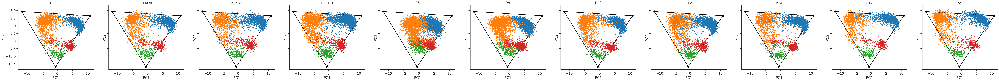

In [25]:
# plot
n = len(todo_conds)
fig, axs = plt.subplots(1,n,figsize=(8*n,6), sharex=True, sharey=True)
for i, cond in enumerate(todo_conds):
    ax = axs[i]
    # aa = aas[-1]
    xp = res[res['cond']==cond][['pcs_later1', 'pcs_later2']].values # pcs_later[:,:2]
    lb = res[res['cond']==cond]['Subclass'].values # pcs_later[:,:2]
    types_colorvec = np.array(['C0', 'C1', 'C2', 'C3'])[lb.codes]
    
    ax.scatter(xp[:,0], xp[:,1], c=types_colorvec, s=2)
    plot_archetype(ax, aa, fmt='-o', color='k', zorder=0)
    ax.set_title(cond)

    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_aspect('equal')
    sns.despine(ax=ax)
    ax.grid(False)
    
plt.show()

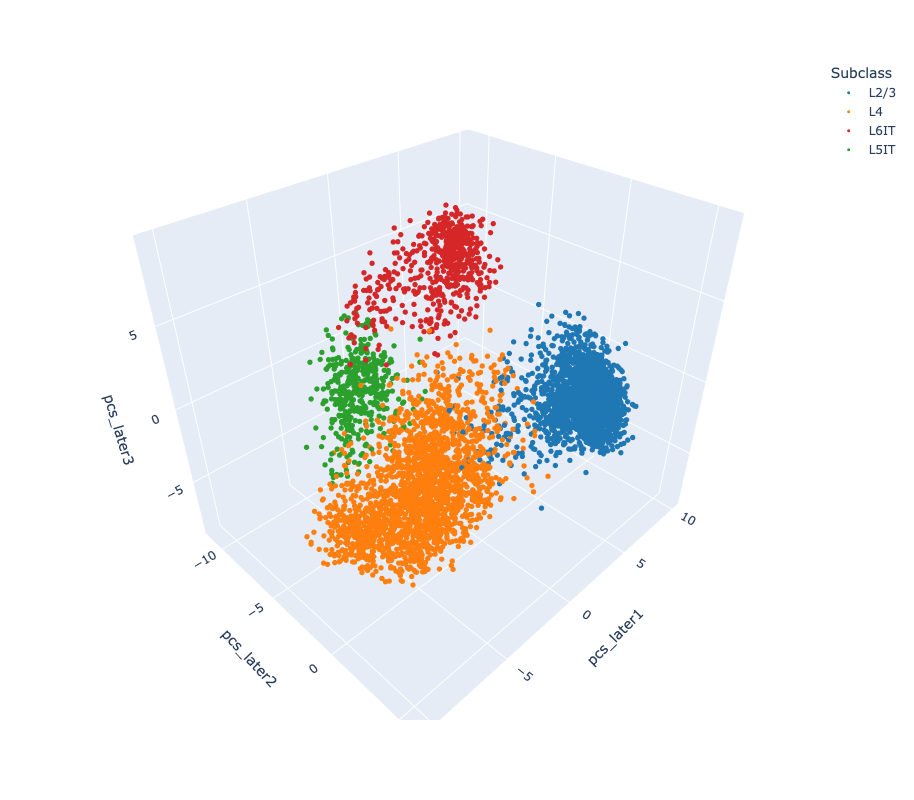

In [26]:
import plotly.express as px

# Define your custom mapping
custom_colors = {
    "L2/3": "#1f77b4",
    "L4":   "#ff7f0e", 
    "L5IT": "#2ca02c",
    "L6IT": "#d62728",
}

# Example using a built-in dataset
df = res[res['cond']=='P21'][['pcs_later1', 'pcs_later2', 'pcs_later3', 'Subclass']]
fig = px.scatter_3d(df, x='pcs_later1', y='pcs_later2', z='pcs_later3',
                      color='Subclass', 
                      color_discrete_map=custom_colors,
                   )
fig.update_traces(marker_size=3) 
fig.update_layout(width=1000, height=800)

fig.update_scenes(xaxis_autorange="reversed") 
fig.update_layout(scene_dragmode='orbit')
fig.show()


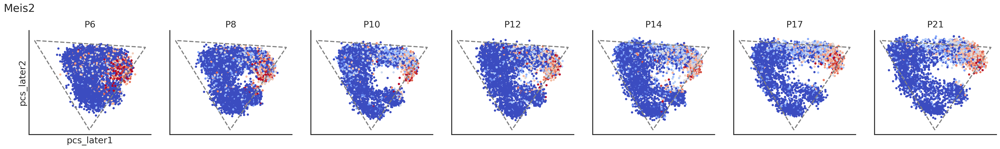

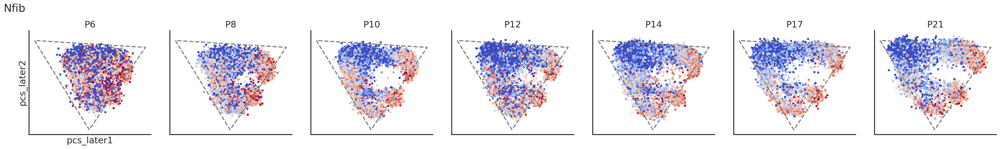

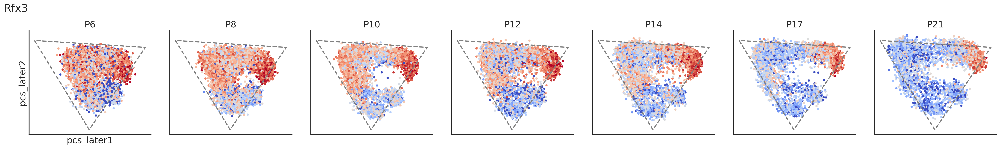

In [27]:
genes_viz = [
    'Meis2', # A
    'Nfib',
    'Rfx3',
]
cases_nr_short = [
    'P6', 'P8', 'P10', 
    'P12', 'P14', 'P17', 
    'P21',
]

for gn in genes_viz:
    vmin = np.percentile(res[gn],  2)
    vmax = np.percentile(res[gn], 98)
    
    fig = plot3('pcs_later1', 'pcs_later2', gn, aspect_equal=True, s=20, vmin=vmin, vmax=vmax) #vmaxp=98, vminp=2)
    axs = fig.get_axes()
    for ax in axs:
        plot_archetype(ax, aa, fmt='--', color='gray', zorder=2)
    
    # output = os.path.join(outdirfig, f'pc12_{gn}.pdf')
    # powerplots.savefig_autodate(fig, output)
    plt.show()
    
    # break
    

# define transcriptomic order (using dpt)

In [28]:
adata_dpt = adata_hvg_later

In [29]:
dpt_embedding = PCA(n_components=10).fit_transform(adata_dpt.layers['lognorm'][...]) #
adata_dpt.obsm['dpt_embedding'] = dpt_embedding

In [30]:
sc.pp.neighbors(adata_dpt, n_neighbors=30, use_rep='dpt_embedding')

In [31]:
pc1 = adata_dpt.obsm['pca_later'][:,0]
pc2 = adata_dpt.obsm['pca_later'][:,1]

adata_dpt.uns["iroot"] = np.argmax(pc1+pc2)
sc.tl.diffmap(adata_dpt)
sc.tl.dpt(adata_dpt)

In [32]:
num_bins = 100
xm = (1/2 + np.arange(0,num_bins,1))*1/num_bins
adata_dpt.obs['dpt'] = adata_dpt.obs['dpt_pseudotime']
adata_dpt.obs['dpt_bin'] = pd.cut(adata_dpt.obs['dpt'], num_bins, labels=False)
adata_dpt.obs['dpt_qbin'] = pd.qcut(adata_dpt.obs['dpt'], num_bins, labels=False)

cdf = adata_dpt.obs.groupby('dpt_bin').size().reindex(np.arange(num_bins)).fillna(0)
cdf_by_subclass = adata_dpt.obs.groupby(['dpt_bin', 'Subclass']).size().unstack().reindex(np.arange(num_bins)).fillna(0)
cdf_by_type = adata_dpt.obs.groupby(['dpt_bin', 'Type']).size().unstack().reindex(np.arange(num_bins)).fillna(0)

qcdf = adata_dpt.obs.groupby('dpt_qbin').size()
qcdf_by_subclass = adata_dpt.obs.groupby(['dpt_qbin', 'Subclass']).size().unstack()
qcdf_by_type = adata_dpt.obs.groupby(['dpt_qbin', 'Type']).size().unstack()

# gene expression as a function of the order
- for all genes 

In [33]:
# get all info
mat = adata[adata_dpt.obs.index].layers['norm']
df = pd.DataFrame(mat, columns=adata.var.index, index=adata_dpt.obs.index)
df['dpt'] = adata_dpt.obs['dpt']
df['dpt_bin'] = adata_dpt.obs['dpt_bin']
df['dpt_qbin'] = adata_dpt.obs['dpt_qbin']
yms = df.groupby('dpt_bin').mean()
qyms = df.groupby('dpt_qbin').mean()

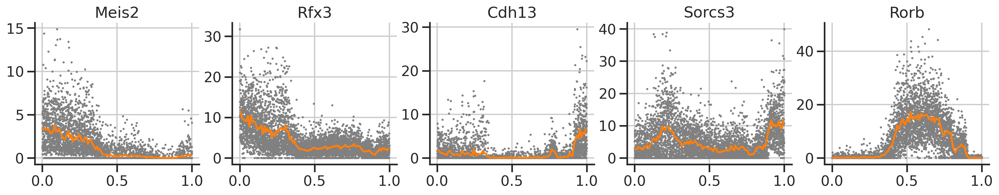

In [34]:
qx = adata_dpt.obs['dpt'].rank(pct=True)

gns = ['Meis2', 'Rfx3', 'Cdh13', 'Sorcs3', 'Rorb']
n = len(gns)

fig, axs = plt.subplots(1,n,figsize=(n*4,1*3))
for i, gn in enumerate(gns):
    ax = axs[i]
    
    y = np.array(adata_dpt[:,gn].layers['norm']).reshape(-1,)
    ax.scatter(qx, y, s=1, color='gray')
    
    ax.plot(xm, qyms[gn], color='C1')
    
    sns.despine(ax=ax)
    ax.set_title(gn)
plt.show()

# cell density along dpt as a control

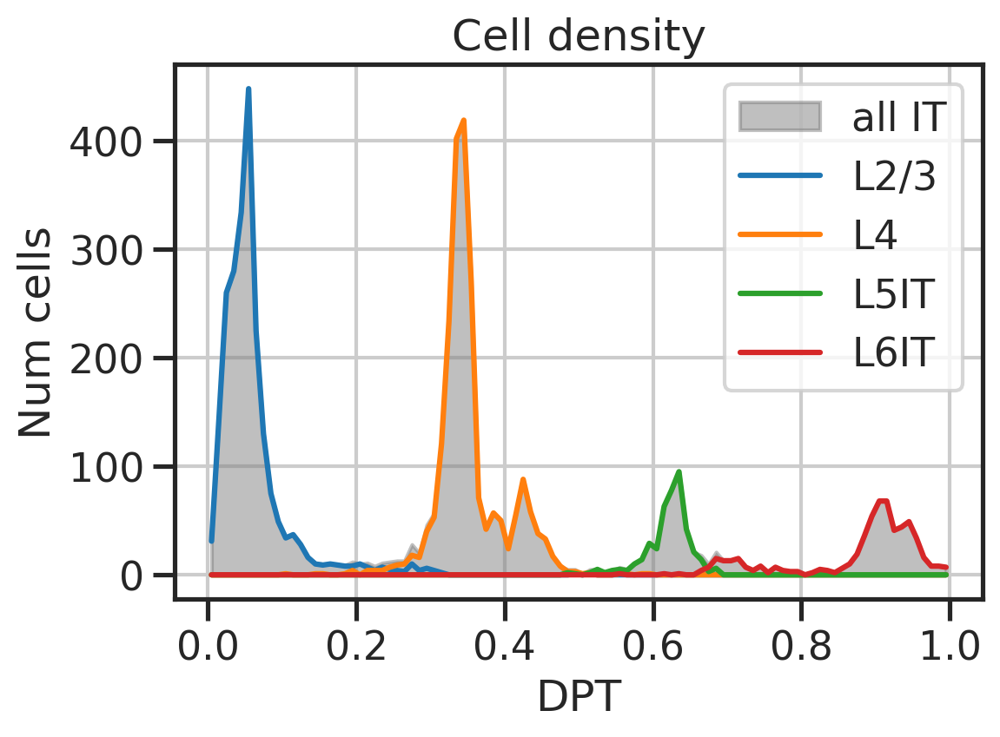

In [35]:
fig, ax = plt.subplots(figsize=(6,4))
ax.fill_between(xm, cdf, color='gray', label='all IT', alpha=0.5)
for subclass in cdf_by_subclass.columns:
    ax.plot(xm, cdf_by_subclass[subclass], label=subclass)
ax.legend(bbox_to_anchor=(1,1))
ax.set_title('Cell density')
ax.set_xlabel('DPT')
ax.set_ylabel('Num cells')
plt.show()

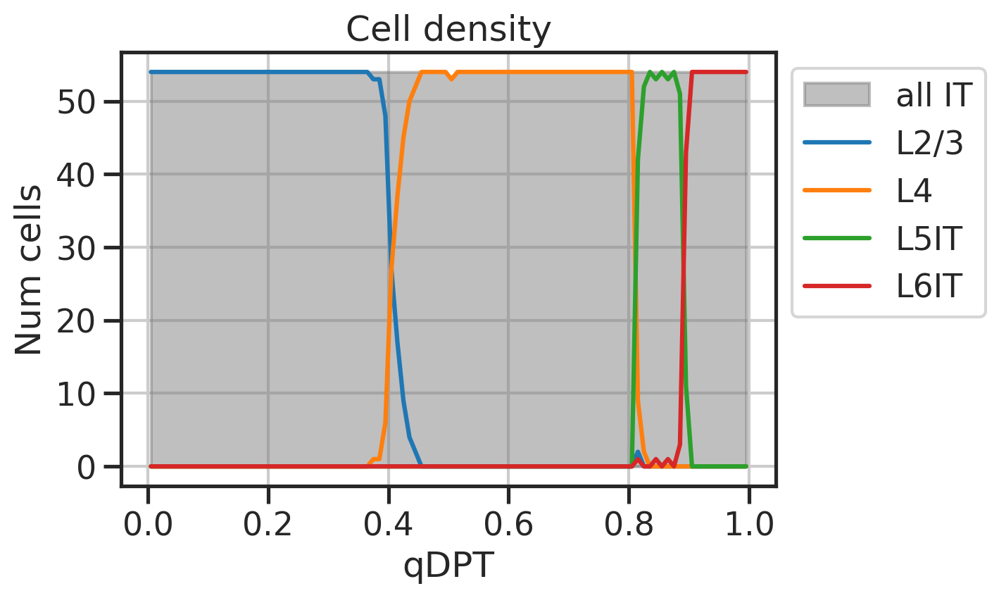

In [36]:
fig, ax = plt.subplots(figsize=(6,4))
ax.fill_between(xm, qcdf, color='gray', label='all IT', alpha=0.5)
for subclass in qcdf_by_subclass.columns:
    ax.plot(xm, qcdf_by_subclass[subclass], label=subclass)
ax.legend(bbox_to_anchor=(1,1))
ax.set_title('Cell density')
ax.set_xlabel('qDPT')
ax.set_ylabel('Num cells')
plt.show()

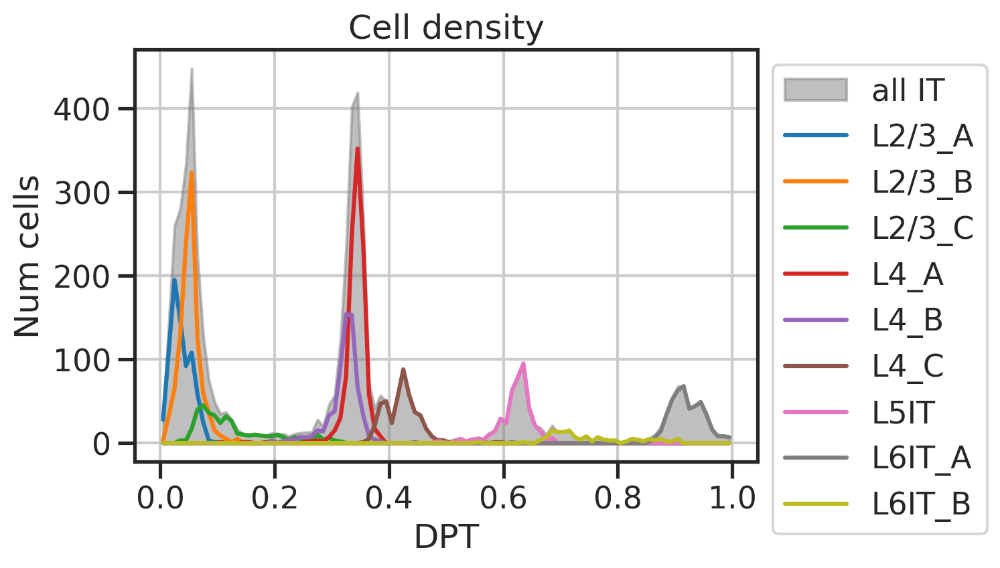

In [37]:
fig, ax = plt.subplots(figsize=(6,4))
ax.fill_between(xm, cdf, color='gray', label='all IT', alpha=0.5)
for col in cdf_by_type.columns:
    ax.plot(xm, cdf_by_type[col], label=col)
ax.legend(bbox_to_anchor=(1,1))
ax.set_title('Cell density')
ax.set_xlabel('DPT')
ax.set_ylabel('Num cells')
plt.show()

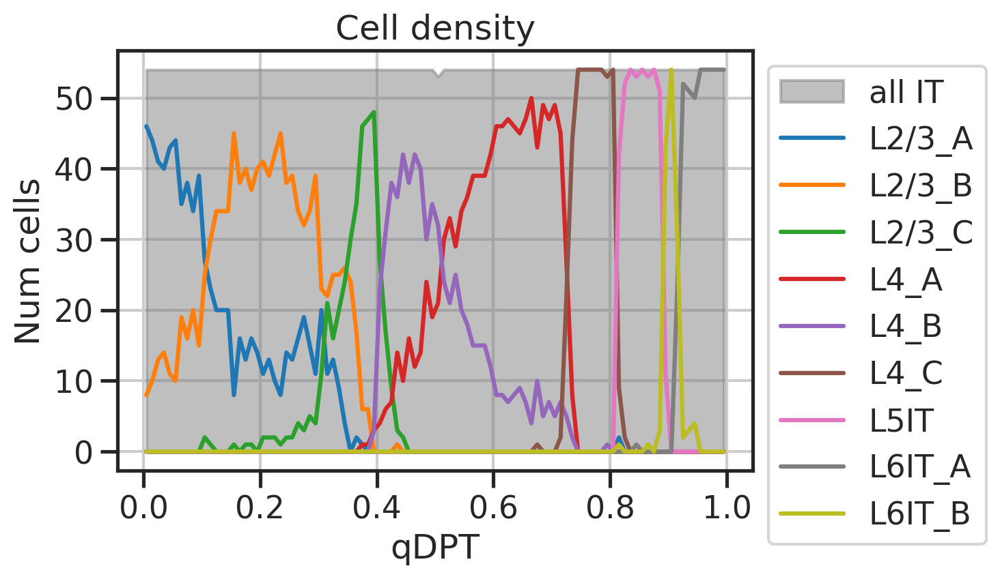

In [38]:
fig, ax = plt.subplots(figsize=(6,4))
ax.fill_between(xm, qcdf, color='gray', label='all IT', alpha=0.5)
for col in qcdf_by_type.columns:
    ax.plot(xm, qcdf_by_type[col], label=col)
ax.legend(bbox_to_anchor=(1,1))
ax.set_title('Cell density')
ax.set_xlabel('qDPT')
ax.set_ylabel('Num cells')
plt.show()

## DPT for each time point. And check subclass and type distribution
- root cell from PC_P21
- save each file individually
- check alignment of cell types

In [95]:
%%time

adata_list = []
for cond in adata.obs['cond'].unique():
    print(cond)
    adata_dpt = adata_hvg[adata_hvg.obs['cond']==cond]
    
    dpt_embedding = PCA(n_components=10).fit_transform(adata_dpt.layers['lognorm'][...]) #
    adata_dpt.obsm['dpt_embedding'] = dpt_embedding
    sc.pp.neighbors(adata_dpt, n_neighbors=30, use_rep='dpt_embedding')
    pc1 = adata_dpt.obsm['pca_later'][:,0]
    pc2 = adata_dpt.obsm['pca_later'][:,1]

    adata_dpt.uns["iroot"] = np.argmax(pc1+pc2)
    sc.tl.diffmap(adata_dpt)
    sc.tl.dpt(adata_dpt)
    
    # add bins
    num_bins = 100
    xm = (1/2 + np.arange(0,num_bins,1))*1/num_bins
    adata_dpt.obs['dpt'] = adata_dpt.obs['dpt_pseudotime']
    adata_dpt.obs['dpt_bin'] = pd.cut(adata_dpt.obs['dpt'], num_bins, labels=False)
    adata_dpt.obs['dpt_qbin'] = pd.qcut(adata_dpt.obs['dpt'], num_bins, labels=False)
    
    # save
    fout = os.path.join(outdirdata, f'multiome_dpt_{cond}.h5ad')
    adata_dpt.write(fout)
    print(fout)
    adata_list.append(adata_dpt)

P6
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome/multiome_dpt_P6.h5ad
P8
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome/multiome_dpt_P8.h5ad
P10
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome/multiome_dpt_P10.h5ad
P12
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome/multiome_dpt_P12.h5ad
P12DR
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome/multiome_dpt_P12DR.h5ad
P14
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome/multiome_dpt_P14.h5ad
P14DR
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome/multiome_dpt_P14DR.h5ad
P17
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome/multiome_dpt_P17.h5ad
P17DR
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome/multiome_dpt_P17DR.h5ad
P21
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome/multiome_dpt_P21.h5ad
P21DR
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome/multiome_dpt_P21DR.h5ad
CPU times: user 1min

In [96]:
cdf = adata_dpt.obs.groupby('dpt_bin').size().reindex(np.arange(num_bins)).fillna(0)
cdf_by_subclass = adata_dpt.obs.groupby(['dpt_bin', 'Subclass']).size().unstack().reindex(np.arange(num_bins)).fillna(0)
cdf_by_type = adata_dpt.obs.groupby(['dpt_bin', 'Type']).size().unstack().reindex(np.arange(num_bins)).fillna(0)

qcdf = adata_dpt.obs.groupby('dpt_qbin').size()
qcdf_by_subclass = adata_dpt.obs.groupby(['dpt_qbin', 'Subclass']).size().unstack()
qcdf_by_type = adata_dpt.obs.groupby(['dpt_qbin', 'Type']).size().unstack()

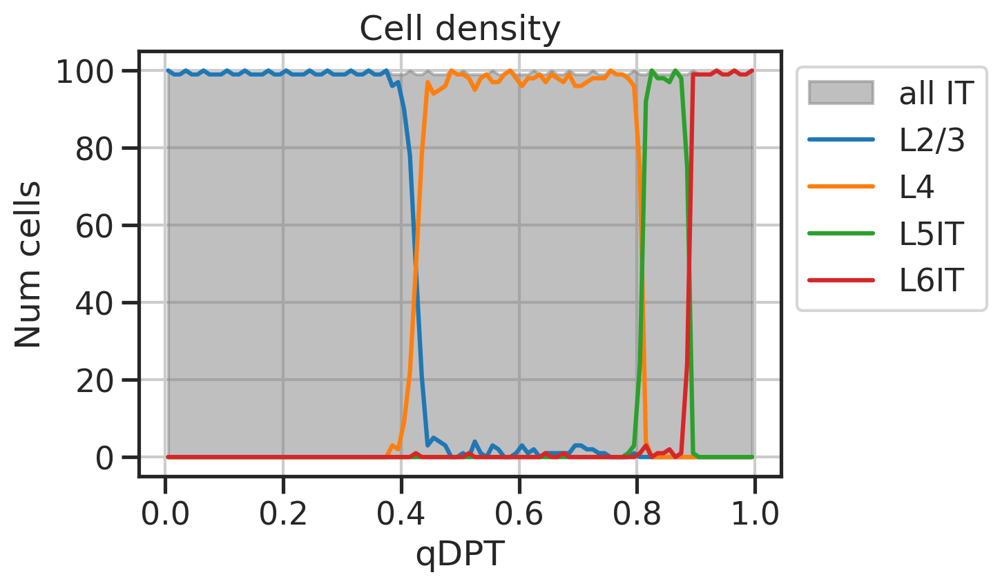

In [97]:
fig, ax = plt.subplots(figsize=(6,4))
ax.fill_between(xm, qcdf, color='gray', label='all IT', alpha=0.5)
for subclass in qcdf_by_subclass.columns:
    ax.plot(xm, qcdf_by_subclass[subclass], label=subclass)
ax.legend(bbox_to_anchor=(1,1))
ax.set_title('Cell density')
ax.set_xlabel('qDPT')
ax.set_ylabel('Num cells')
plt.show()

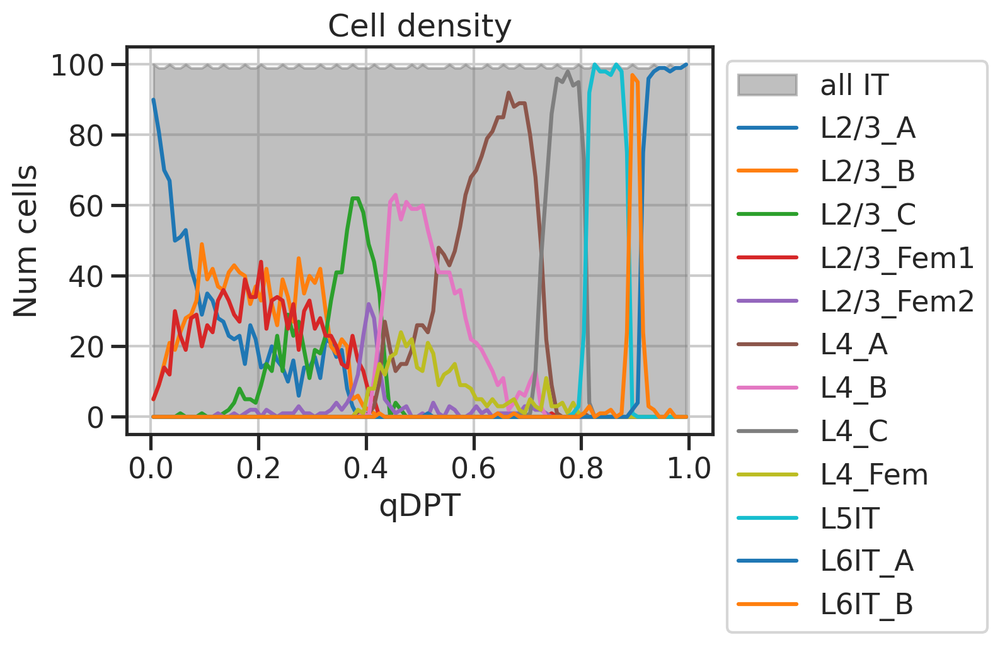

In [98]:
fig, ax = plt.subplots(figsize=(6,4))
ax.fill_between(xm, qcdf, color='gray', label='all IT', alpha=0.5)
for col in qcdf_by_type.columns:
    ax.plot(xm, qcdf_by_type[col], label=col)
ax.legend(bbox_to_anchor=(1,1))
ax.set_title('Cell density')
ax.set_xlabel('qDPT')
ax.set_ylabel('Num cells')
plt.show()